In [78]:
from config import ASSETS_DIR, HYPERPARAMETERS_FILE, DATA_BASE_DIR, SEED
from utils import log, reporting, attention
import os
import json
import numpy as np
import plotly
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
from sklearn import cluster, decomposition, manifold
import torch


logger = log.get_logger()

In [36]:
OPTIMIZATION_METRIC = "log_loss"
OPTIMIZATION_MODE = "min"
EVALUATION_METRIC = "balanced_accuracy"

MAPPINGS = {
    "dataset_name": {
            "jasmine": "jasmine",
            "anneal": "anneal",
            "australian": "australian",
            "kr-vs-kp": "kr-vs-kp",
            "sylvine": "sylvine",
            "nomao": "nomao",
            "volkert": "volkert",
            "adult": "adult",
            "ldpa": "ldpa"
        },
    "aggregator_name": {
        "cls": "CLS",
        "concatenate": "CAT",
        "max": "MAX",
        "mean": "AVG",
        "rnn": "RNN",
        "sum": "SUM",
    }
}

DATASET_ORDER = ["jasmine", "anneal", "australian", "kr-vs-kp", "sylvine", "nomao", "volkert", "adult", "ldpa"]
AGGREGATOR_ORDER = ["CLS", "CAT", "RNN", "MAX", "AVG", "SUM"]
FEATURE_SELECTION_ORDER = ["attention", "decision_tree", "linear_model", "f_classif", "random"]
    
COLORS = ["#ffc5de", "#ffefd8", "#c7f7f7", "#d1d1d1", "#bedfff", "#e1c5ff"]
COLORS = np.array(plotly.colors.qualitative.Plotly)

HP_IMPORTANCE_TOP_K = [1, 5]
IMG_SCALE = 2.5

# Best test models

In [65]:
best_archs_test = pd.read_csv("selected_architectures.csv")
best_archs_test["dataset"] = best_archs_test["dataset"].replace(MAPPINGS["dataset_name"])
best_archs_test["aggregator"] = best_archs_test["aggregator"].replace(MAPPINGS["aggregator_name"])
best_archs_test = best_archs_test.query("selection_metric == @OPTIMIZATION_METRIC")
best_archs_test[f"{EVALUATION_METRIC}_test_mean"] = best_archs_test[f"{EVALUATION_METRIC}_test_mean"] * 100
best_archs_test[f"{EVALUATION_METRIC}_test_std"] = best_archs_test[f"{EVALUATION_METRIC}_test_std"] * 100
best_archs_test[f"{EVALUATION_METRIC}_test_max"] = best_archs_test[f"{EVALUATION_METRIC}_test_max"] * 100
best_archs_test[f"{EVALUATION_METRIC}_test_min"] = best_archs_test[f"{EVALUATION_METRIC}_test_min"] * 100
best_archs_test = best_archs_test.sort_values("dataset", key=lambda x: x.apply(DATASET_ORDER.index))
best_archs_test[["dataset", "aggregator", "architecture_name", "checkpoint_dir", f"{EVALUATION_METRIC}_test_mean", f"{EVALUATION_METRIC}_test_std", f"{EVALUATION_METRIC}_test_max", f"{EVALUATION_METRIC}_test_min"]]

,dataset,aggregator,architecture_name,checkpoint_dir,balanced_accuracy_test_mean,balanced_accuracy_test_std,balanced_accuracy_test_max,balanced_accuracy_test_min
3,jasmine,RNN,A39,checkpoint/jasmine/best/log_loss/T1,79.543885,2.100097,82.868908,77.661327
1,anneal,CAT,A37,checkpoint/anneal/best/log_loss/T1,99.636364,0.813116,100.000000,98.181818
2,australian,SUM,A35,checkpoint/australian/best/log_loss/T3,87.900788,2.752097,90.195870,83.329785
4,kr-vs-kp,CAT,A39,checkpoint/kr-vs-kp/best/log_loss/T0,99.593421,0.207034,99.687473,99.223076
5,sylvine,CLS,A53,checkpoint/sylvine/best/log_loss/T0,95.202399,0.355764,95.661653,94.801980
6,volkert,CLS,A1,checkpoint/volkert/best/log_loss/T1,56.147338,0.852821,57.103495,55.008948
0,adult,CLS,A1,checkpoint/adult/best/log_loss/T4,78.222632,0.119212,78.384178,78.069983


# Cumulative attention

In [6]:
def load_attention_with_meta(dataset, selection_metric):
    data_dir = os.path.join(DATA_BASE_DIR, dataset)
    attention_file = os.path.join(data_dir, "feature_selection", selection_metric, "attention.npy")
    attention_file_info = os.path.join(data_dir, "feature_selection", selection_metric, "feature_selection_info.json")
    
    attn = np.load(attention_file)

    with open(attention_file_info, "r") as f:
        data_meta = json.load(f)
        
    return attn, data_meta

# Attention clustering

In [235]:
dataset = "kr-vs-kp"

d_job = best_archs_test.query("dataset==@dataset").to_dict()
d_job = {k: list(v.values())[0] for k, v in d_job.items()}
d_job["aggregator"] = list(MAPPINGS["aggregator_name"].keys())[list(MAPPINGS["aggregator_name"].values()).index(d_job["aggregator"])]

result = attention.extract_attention(
        dataset,
        d_job["checkpoint_dir"],
        d_job["aggregator"],
        OPTIMIZATION_METRIC,
        d_job, 
        return_labels=True,
    )

INFO:root:++++++++++++++++++++++++++++++++++++++++ Extracting kr-vs-kp-log_loss
INFO:root:Loading preprocessor
INFO:root:Reading data
INFO:root:Training size: (2556, 37)
INFO:root:Test size: (640, 37)
INFO:root:Total size: (3196, 37)
INFO:root:Sorting dataset as original
INFO:root:Preprocessing data
INFO:root:Building model
INFO:root:Loading checkpoint


/home/uriel/miniconda3/envs/TT/lib/python3.11/site-packages/torch/nn/modules/transformer.py:286: UserWarning:

enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer was not TransformerEncoderLayer



In [236]:
attn = result["cumulated_attention"].copy()
labels = result["labels"].copy()

cluster_labels = None
c_l_start = 0
c_l_end = 0
c_l = 0
cluster_found = False

bf_cluster_labels = None
bf_c_l_start = 0
bf_c_l_end = 0
bf_c_l = 0


# Test with each n-clustering option
for n_cluster_test in [2]:
    logger.info(f"Test using {n_cluster_test} clusters")
    
    cluster_algo = cluster.KMeans(n_clusters=n_cluster_test, random_state=SEED)
    cluster_labels = cluster_algo.fit_predict(attn)

    indices = np.lexsort((labels, cluster_labels))
    t_attn = attn[indices]
    t_labels = labels[indices]
    t_cluster_labels = cluster_labels[indices] # Cambiar esta linea

    cluster_uniques, clusters_indices = np.unique(t_cluster_labels, return_index=True) # Cambiar esta linea
    clusters_indices = np.array(clusters_indices.tolist() + [cluster_labels.shape[0]])

    feasible_clusters = np.zeros(cluster_uniques.shape[0]).astype(bool)
    clusters_entropy = np.zeros(cluster_uniques.shape[0])
    
    # Test each cluster
    for c_l, c_l_start, c_l_end in zip(cluster_uniques, clusters_indices[:-1], clusters_indices[1:]):
        processable = True
        # Mean cluster entropy
        cluster_entropy = t_attn[c_l_start:c_l_end] * np.log(t_attn[c_l_start:c_l_end])
        cluster_entropy = -cluster_entropy.sum(axis=-1).mean()
        clusters_entropy[c_l] = cluster_entropy

        processable = processable and bool(cluster_entropy <= 0.7 * np.log(1 / t_attn.shape[-1]))

        # Non predominant class
        c_labels = t_labels[c_l_start:c_l_end]
        existing_labels = np.unique(c_labels)
        # At least two classes
        processable = len(existing_labels) >= 2
        # The most dominant class is lower than 70% of total 
        for e_c in existing_labels:   
            fraction_dataset = c_labels[c_labels == e_c].shape[0] / c_labels.shape[0]
            processable = processable and (fraction_dataset <= 0.85)

        feasible_clusters[c_l] = processable

    # If at least one is processable
    if not feasible_clusters.sum() >= 1:
        logger.info(f"Non feasible cluster with {n_cluster_test} cluster")
        continue

    # Select the cluster with lower entropy
    logger.info(f"Entropies: {clusters_entropy}")
    logger.info(f"Feasible: {feasible_clusters}")
    prefered_cluster = np.argsort(clusters_entropy)
    logger.info(f"Prefered cluster: {prefered_cluster}")

    if not feasible_clusters[prefered_cluster[0]]:
        logger.info("Prefered cluster is not feasible")

        if bf_cluster_labels is None:
            logger.info("Saving if any found")
            for p_c in prefered_cluster:
                if feasible_clusters[p_c]:
                    bf_cluster = p_c
                    break

            bf_cluster_labels = cluster_labels.copy()
            bf_c_l_start = clusters_indices[bf_cluster]
            bf_c_l_end = clusters_indices[bf_cluster + 1]
            bf_c_l = cluster_uniques[bf_cluster]
        
        continue

    prefered_cluster = prefered_cluster[0]
    cluster_found = True
    
    c_l_start = clusters_indices[prefered_cluster]
    c_l_end = clusters_indices[prefered_cluster + 1]
    c_l = cluster_uniques[prefered_cluster]

    break

if not cluster_found:
    logger.warning("Any cluster was feasible. Taking best found.")
    cluster_labels = bf_cluster_labels
    c_l_start = bf_c_l_start
    c_l_end = bf_c_l_end
    c_l = bf_c_l

indices = np.lexsort((labels, cluster_labels))
attn = attn[indices]
labels = labels[indices]
cluster_labels = cluster_labels[indices]

attn_info = {
    "data_required_sort": indices.tolist(),
    "labels": labels.tolist(),
    "cluster_labels": cluster_labels.tolist(),
}

attn_info["process"] = {
    "best_found": bool(cluster_found),
    "cluster": int(c_l),
    "start_index": int(c_l_start),
    "end_index": int(c_l_end),
    "splits": {}
}


data_meta = attn_info

INFO:root:Test using 2 clusters
INFO:root:Entropies: [3.5458971  3.43273974]
INFO:root:Feasible: [ True  True]
INFO:root:Prefered cluster: [1 0]


# Simulating printing in report

In [237]:
p_method_name = "pca"
p_method = decomposition.PCA(n_components=2)

attn_plottable = p_method.fit_transform(attn) 

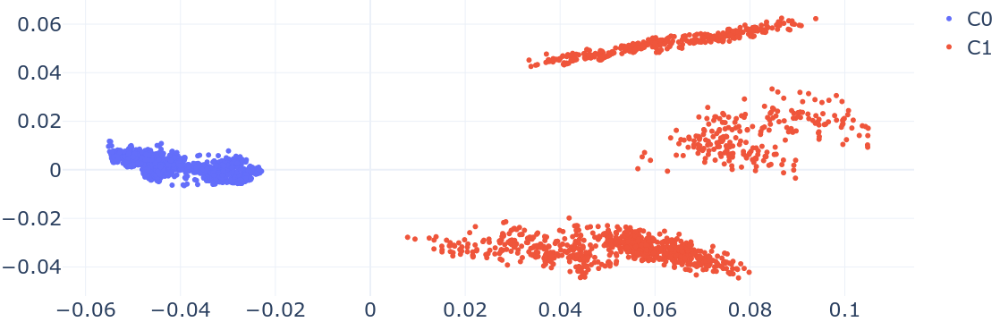

In [238]:
fig = go.Figure(layout=layout)

for c_l in np.unique(cluster_labels):
    c_l_mask = (cluster_labels == c_l)
    fig.add_trace(go.Scatter(
                    name=f"C{c_l}",
                    x=attn_plottable[c_l_mask, 0],
                    y=attn_plottable[c_l_mask, 1],
                    mode="markers",
                    marker=dict(
                        color=COLORS[c_l],
                        size=6
                    )
    ))

fig.show()   

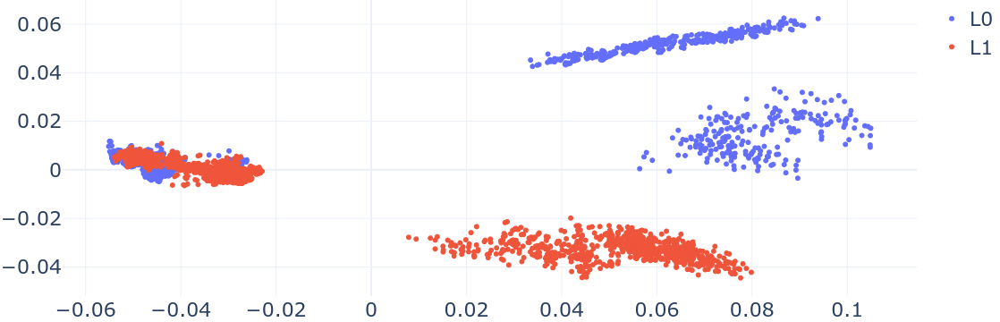

In [239]:
fig = go.Figure(layout=layout)

for c_l in np.unique(labels.astype(int)):
    c_l_mask = (labels == c_l)
    fig.add_trace(go.Scatter(
                    name=f"L{c_l}",
                    x=attn_plottable[c_l_mask, 0],
                    y=attn_plottable[c_l_mask, 1],
                    mode="markers",
                    marker=dict(
                        color=COLORS[c_l],
                        size=6
                    )
    ))

fig.show()   

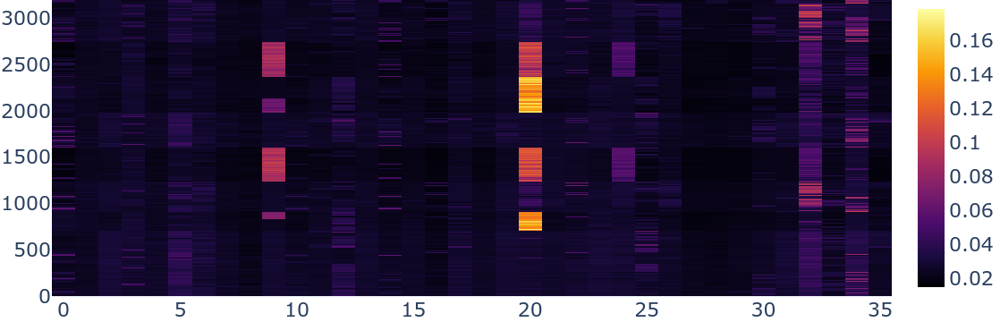

In [240]:
fig = go.Figure(layout=layout)
fig.add_trace(go.Heatmap(z=result["cumulated_attention"], colorscale="Inferno"))
fig.update_layout()
fig.show()

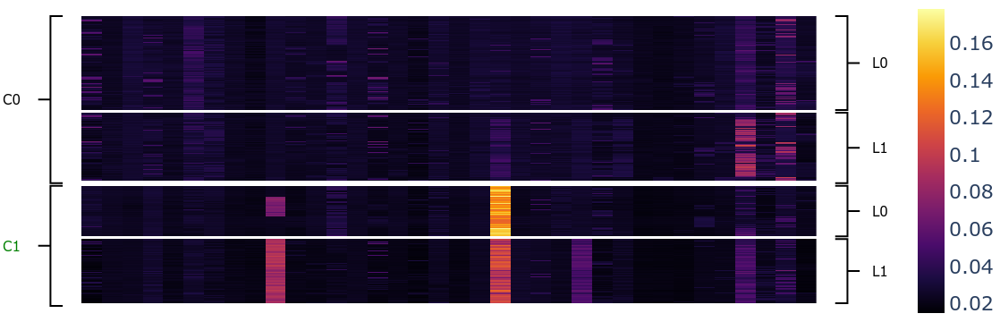

In [241]:
dataset_labels_values = {
    "jasmine": -5,
    "anneal": -1.5,
    "australian": -0.8,
    "kr-vs-kp": -2,
    "sylvine": -1,
    "nomao": -1,
    "volkert": -1,
    "adult": -0.8,
    "ldpa": -1
}


axis_template = dict(
                    showticklabels = False,
                    ticks="",
                    zeroline=False,
                    showgrid=False
                )

line_style = dict(
                            color='#000',
                            width=2
                        )

labels, cluster_labels = data_meta["labels"], data_meta["cluster_labels"]
best_found_cluster = data_meta["process"]["best_found"] 
processed_cluster = data_meta["process"]["cluster"]
n_instances, n_features = attn.shape

# Adding blank rows for clusters
sep = np.ones((1, n_features)) * np.nan
sep_width = int(n_instances * 0.01)
sep_indices = np.unique(cluster_labels, return_index=True)[1]
rep_sep_indices = np.repeat(sep_indices[1:], sep_width)
attn = np.insert(attn, rep_sep_indices, sep, axis=0)
brace_labels = np.insert(labels, rep_sep_indices, -1, axis=0)
        
# Adding blank rows for labels
l_sep_width = int(n_instances * 0.01)
original_clusters_limits = np.array(sep_indices.tolist() + [n_instances])
l_sep_indices = []
for s_i, (s_i_s, s_i_e) in enumerate(zip(original_clusters_limits[:-1], original_clusters_limits[1:])):
    l_sep_indices += (
                    np.unique(labels[s_i_s:s_i_e], return_index=True)[1] \
                    + s_i_s 
                    + s_i * sep_width
                ).tolist()

l_rep_sep_indices = np.repeat(l_sep_indices[1:], l_sep_width)
attn = np.insert(attn, l_rep_sep_indices, sep, axis=0)
brace_labels = np.insert(brace_labels, l_rep_sep_indices, -1, axis=0)


# Adding braces 
braces_indices = np.concatenate([sep_indices, [n_instances]])
data = []
annotations = []
for i, (s, f) in enumerate(zip(braces_indices[:-1], braces_indices[1:])):
    e_offset = (l_sep_indices < f).sum()
    s_offset = (l_sep_indices < s).sum()
    
    lower_val = s + i * sep_width + s_offset * l_sep_width
    upper_val = f + i * sep_width + e_offset * l_sep_width
    middle_val = lower_val + (upper_val - lower_val) // 2
    
    center_val = dataset_labels_values[dataset]
    right_val = center_val - 0.3 * dataset_labels_values[dataset]
    left_val = center_val + 0.3 * dataset_labels_values[dataset]
    
    brace = go.Scatter(
                    x=[right_val, center_val, center_val, left_val, center_val, center_val, right_val], 
                    y=[lower_val, lower_val, middle_val, middle_val, middle_val, upper_val, upper_val], 
                    mode="lines", 
                    line=line_style
                )
    data.append(brace)
    
    ann_color = "#000"
    if processed_cluster == i:
        ann_color = "orange"
        if best_found_cluster:
            ann_color = "green"
    
    annotations.append(dict(
                        text=f"C{cluster_labels[s]}", 
                        x=left_val * 1.5, 
                        y=middle_val,
                        color=ann_color
                        ))

l_sep_indices = np.array(l_sep_indices + [n_instances + (len(np.unique(cluster_labels)) - 1) * sep_width ])
for i, (s, f) in enumerate(zip(l_sep_indices[:-1], l_sep_indices[1:])):
    lower_val = s + i * l_sep_width
    upper_val = f + i * l_sep_width
    middle_val = lower_val + (upper_val - lower_val) // 2
    
    center_val = n_features - 1 - dataset_labels_values[dataset]
    right_val = center_val - 0.3 * dataset_labels_values[dataset]
    left_val = center_val + 0.3 * dataset_labels_values[dataset]
    
    brace = go.Scatter(
                    x=[left_val, center_val, center_val, right_val, center_val, center_val, left_val], 
                    y=[lower_val, lower_val, middle_val, middle_val, middle_val, upper_val, upper_val], 
                    mode="lines", 
                    line=line_style
                )
    data.append(brace)
    annotations.append(dict(
                        text=f"L{int(brace_labels[lower_val])}", 
                        x=right_val - 0.5 * dataset_labels_values[dataset], 
                        y=middle_val,
                        color="#000"
                        ))


   
heatmap_trace = go.Heatmap(x=np.arange(n_features), y=np.arange(n_instances), z=attn, colorscale="Inferno")
data = [heatmap_trace] + data
fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    xaxis=axis_template,
    yaxis=axis_template,
    showlegend=False
)

fig.update_yaxes(autorange="reversed")

for a in annotations:
    fig.add_annotation(x=a["x"], y=a["y"], text=a["text"], showarrow=False, font=dict(color=a["color"], size=15))

fig.show()



In [242]:
0.1 * result["cumulated_attention"].shape[-1]

3.6